In [1]:
%matplotlib inline
import numpy as np
from skimage import util

from scipy.io import wavfile
from scipy import fftpack
from scipy import signal

import matplotlib.pyplot as plt

from IPython.display import Audio

In [2]:
freq = 1  # частота у герцях => сигнал повторюється 1/10 секунду
f_s = 50  # SampleRate = частота дискретизації

start = 0
stop = 2

amplitude = 2
phase = 0

t = np.linspace(start, stop, 2 * f_s, endpoint=False)
x = amplitude * np.sin(freq * 2 * np.pi * t + phase)

In [4]:
num_of_freq = 5 # скільки частот-складових хочемо побачити  у кінцевому сигналі
for i in range(2, num_of_freq):
    x += amplitude * np.sin(freq * i * 2 * np.pi * t + phase)

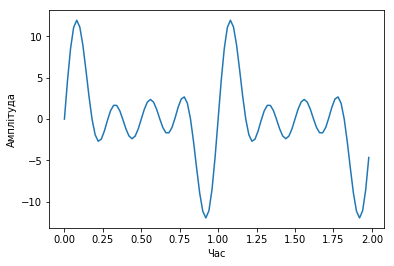

In [5]:
fig, ax = plt.subplots()
ax.plot(t, x)
ax.set_xlabel('Час')
ax.set_ylabel('Амплітуда');

(-1, 105.0)

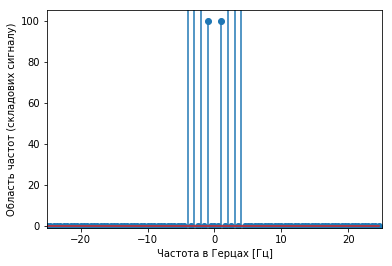

In [6]:
X = fftpack.fft(x)
freqs = fftpack.fftfreq(len(x)) * f_s

fig, ax = plt.subplots()

ax.stem(freqs, np.abs(X))
ax.set_xlabel('Частота в Герцах [Гц]')
ax.set_ylabel('Область частот (складових сигналу)')
ax.set_xlim(-f_s / 2, f_s / 2)
ax.set_ylim(-1, f_s * 2.1)

In [7]:
# реальний приклад
# Спектрограма співу солов'я

In [8]:
Audio('Nightingale-sound.wav')

In [9]:
rate, audio = wavfile.read('Nightingale-sound.wav')
audio = np.mean(audio, axis=1) # перетворення 2х канального аудіо в моно усередненням

In [10]:
audio.shape

(1345536,)

In [11]:
rate

44100

Тривалість: 30.51 сек


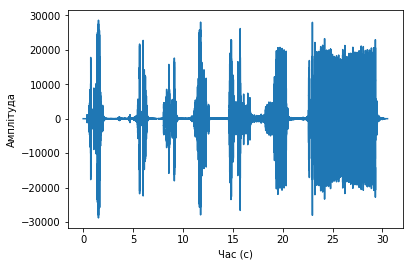

In [12]:
N = audio.shape[0]
L = N / rate

print(f'Тривалість: {L:.2f} сек')

f, ax = plt.subplots()
ax.plot(np.arange(N) / rate, audio)
ax.set_xlabel('Час (с)')
ax.set_ylabel('Амплітуда');

In [14]:
M = 1024

slices = util.view_as_windows(audio, window_shape=(M,), step=100)
print(f'Розмір аудіофайла: {audio.shape}, стало: {slices.shape}')

Розмір аудіофайла: (1345536,), стало: (13446, 1024)


/home/lovely/anaconda3/lib/python3.6/site-packages/skimage/util/shape.py:255: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  indexing_strides = arr_in[slices].strides


In [15]:
win = np.hanning(M + 1)[:-1]
slices = slices * win
slices = slices.T
print('Shape of `slices`:', slices.shape)

Shape of `slices`: (1024, 13446)


In [16]:
spectrum = np.fft.fft(slices, axis=0)[:M // 2 + 1:-1]
spectrum = np.abs(spectrum)

/home/lovely/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:4: RuntimeWarning: divide by zero encountered in log10
  after removing the cwd from sys.path.


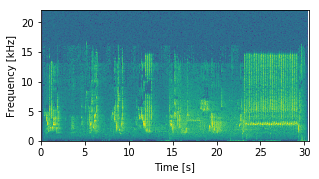

In [17]:
f, ax = plt.subplots(figsize=(4.8, 2.4))

S = np.abs(spectrum)
S = 20 * np.log10(S / np.max(S))

ax.imshow(S, origin='lower', cmap='viridis',
          extent=(0, L, 0, rate / 2 / 1000))
ax.axis('tight')
ax.set_ylabel('Frequency [kHz]')
ax.set_xlabel('Time [s]');

In [88]:
Audio('Nightingale-sound.wav')

C:\Users\unicorn\Anaconda3\lib\site-packages\ipykernel_launcher.py:8: RuntimeWarning: divide by zero encountered in log10
  


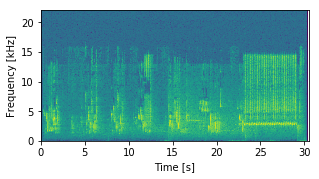

In [14]:
#  то же самое через scipy

freqs, times, Sx = signal.spectrogram(audio, fs=rate, window='hanning',
                                      nperseg=1024, noverlap=M - 100,
                                      detrend=False, scaling='spectrum')

f, ax = plt.subplots(figsize=(4.8, 2.4))
ax.pcolormesh(times, freqs / 1000, 10 * np.log10(Sx), cmap='viridis')
ax.set_ylabel('Frequency [kHz]')
ax.set_xlabel('Time [s]');